<a href="https://colab.research.google.com/github/lmcanavals/ml/blob/main/1201_FirstGan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# My First GAN

In [ ]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

torch.manual_seed(0)

In [ ]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [ ]:
def get_generator_block(input_dim, output_dim):
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True)
    )

In [ ]:
class Generator(nn.Module):
    def __init__(self, z_dim=10, im_dim=28*28, hidden_dim=128):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim*2),
            get_generator_block(hidden_dim*2, hidden_dim*4),
            get_generator_block(hidden_dim*4, hidden_dim*8),
            nn.Linear(hidden_dim*8, im_dim),
            nn.Sigmoid()
        )

    def forward(self, noise):
        return self.gen(noise)

    def get_gen(self):
        return self.gen

In [ ]:
def get_noise(n_samples, z_dim, device='cpu'):
    return torch.randn(n_samples, z_dim, device=device)

In [ ]:
def get_discriminator_block(input_dim, output_dim):
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2, inplace=True)
    )

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, im_dim=28*28, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, image):
        return self.disc(image)

    def get_disc(self):
        return self.disc

## The data?

In [ ]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'
dataloader = DataLoader(MNIST('.', download=True, transform=transforms.ToTensor()),
                        batch_size=batch_size, shuffle=True)

100%|██████████| 9912422/9912422 [00:00<00:00, 212963049.02it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 42773903.19it/s]


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 61702753.26it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 21405088.50it/s]


Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [ ]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [ ]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    return disc_loss

In [ ]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    return gen_loss

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 1.3880873228311557, discriminator loss: 0.41926053875684727


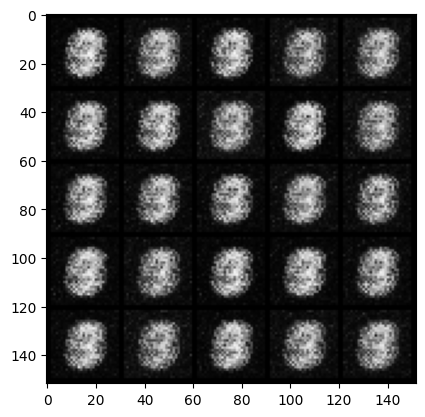

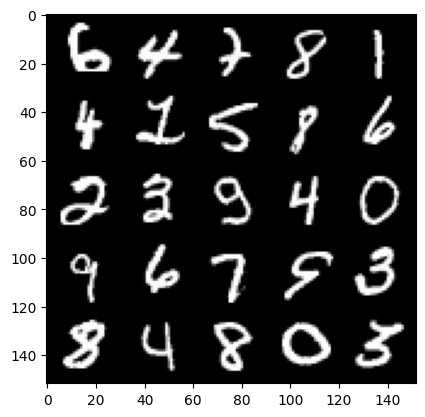

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 1.6689558925628656, discriminator loss: 0.3002842940390108


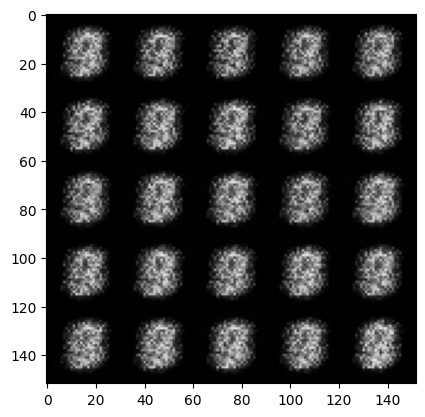

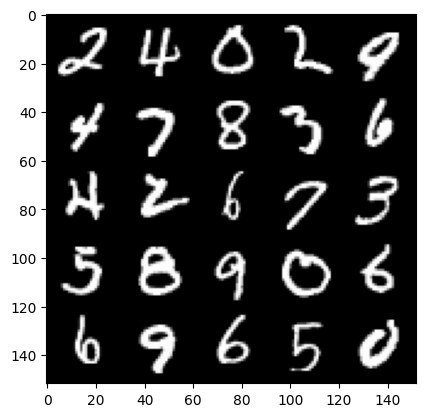

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 1.9592790498733528, discriminator loss: 0.17416932547092448


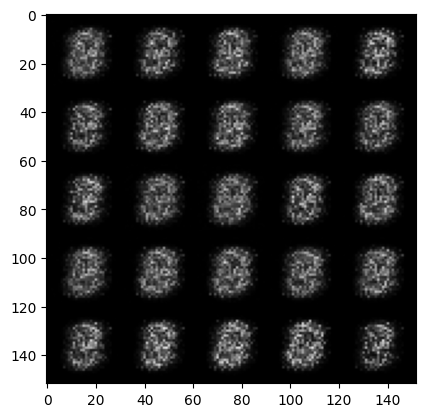

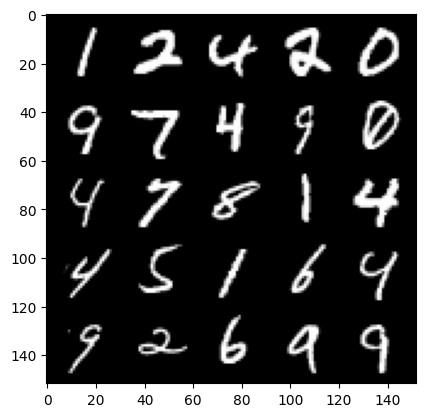

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 1.7619676935672752, discriminator loss: 0.19569288605451596


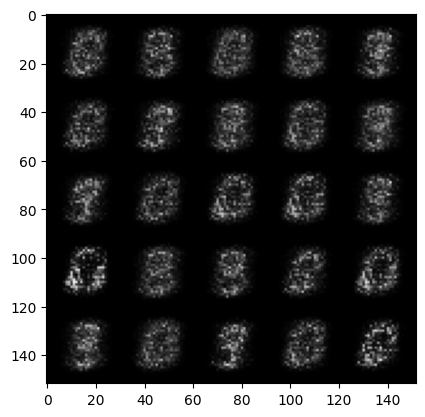

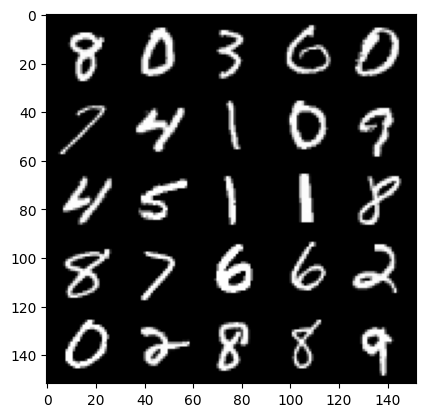

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 1.7258500063419335, discriminator loss: 0.19497434958815554


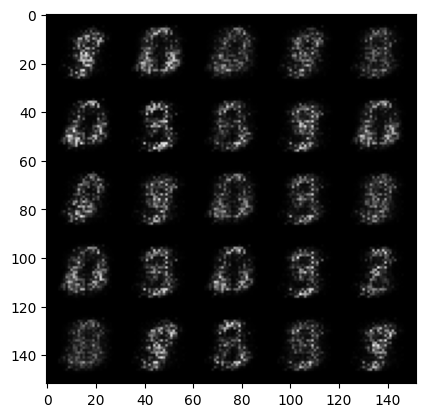

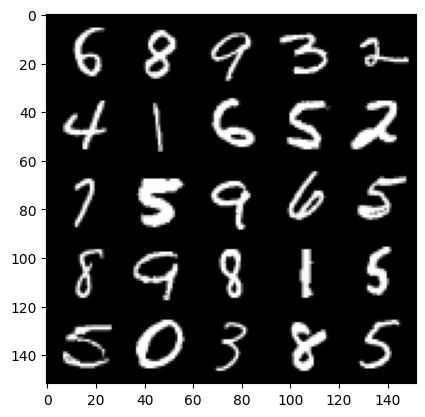

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 2.0243235464096094, discriminator loss: 0.15120411489903926


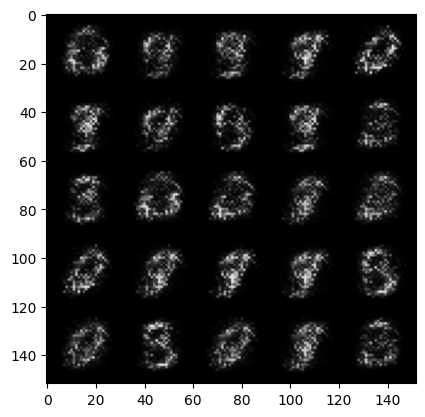

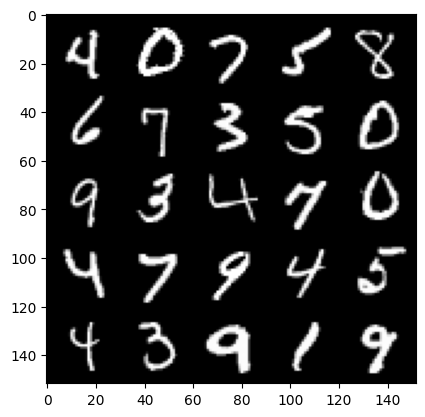

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 2.4020327281951905, discriminator loss: 0.1258226473331451


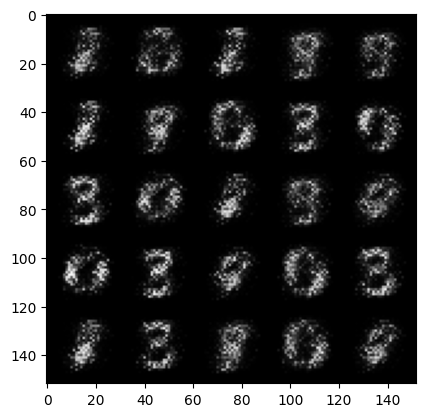

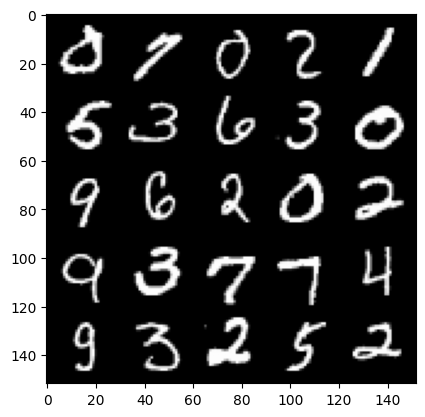

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 2.7117111663818356, discriminator loss: 0.12471856273710727


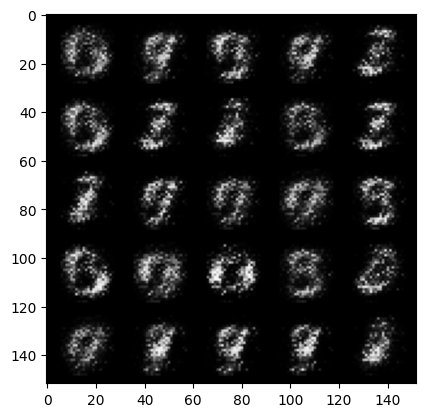

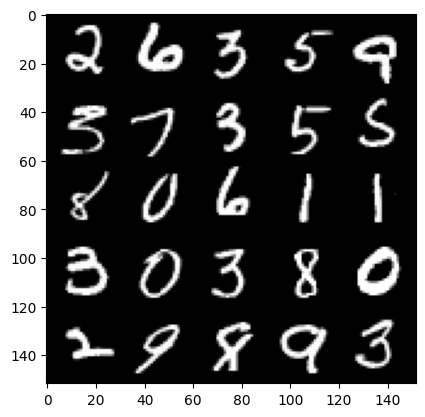

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 3.1849984331130976, discriminator loss: 0.09956459250301121


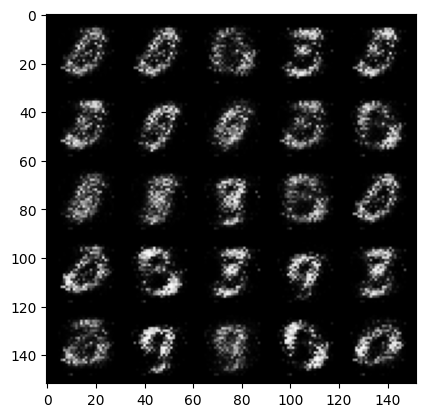

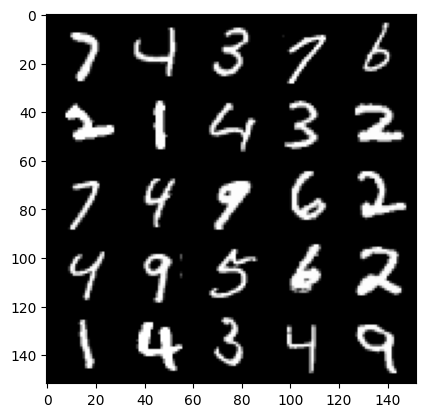

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 3.45715557050705, discriminator loss: 0.08031301844120033


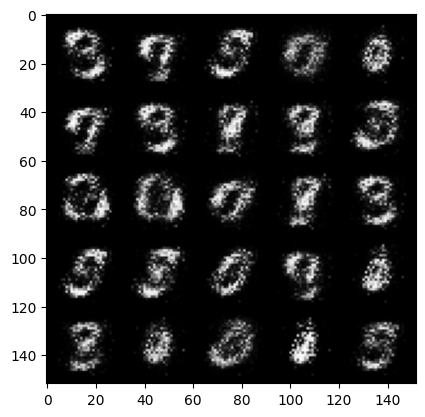

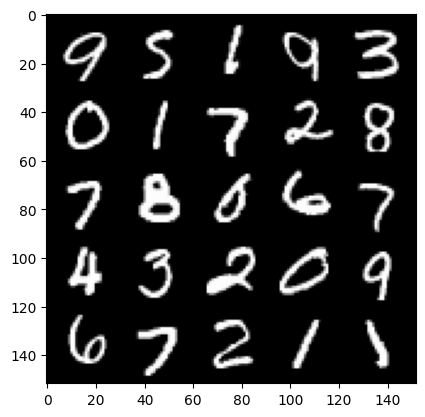

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 3.7340029425621, discriminator loss: 0.08028630419820548


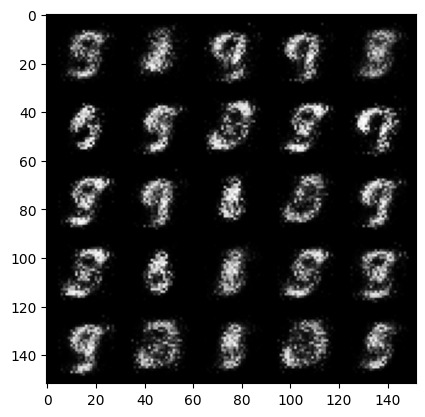

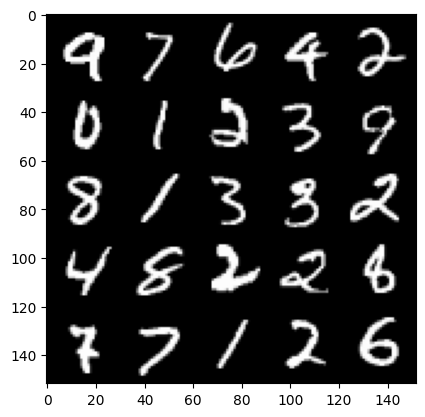

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 3.7575823793411267, discriminator loss: 0.07743757405877118


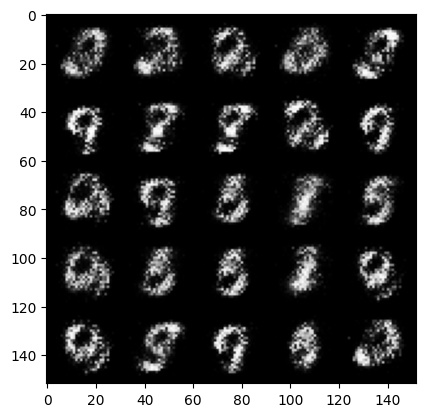

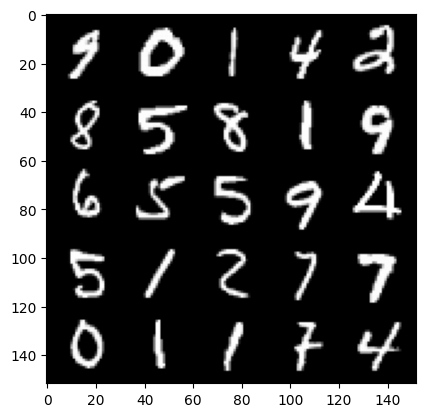

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 3.9026866016387936, discriminator loss: 0.06411620748043063


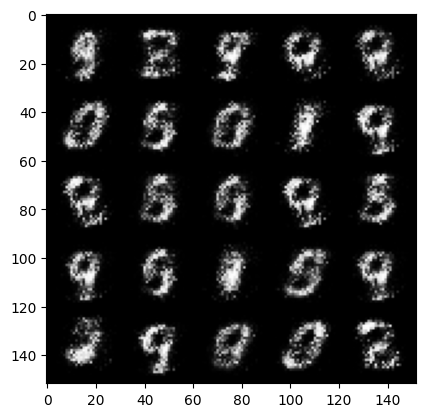

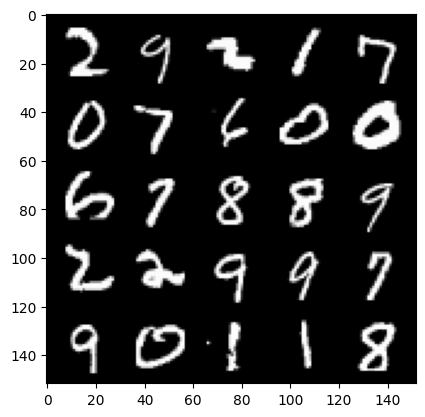

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 3.9832063703536975, discriminator loss: 0.051080272328108606


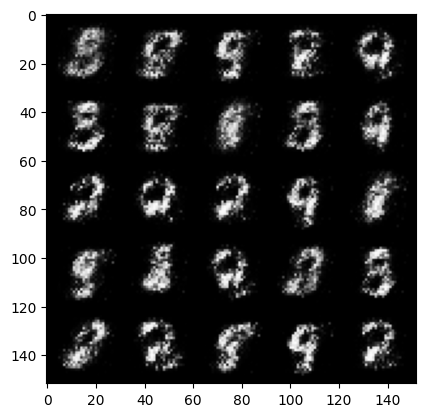

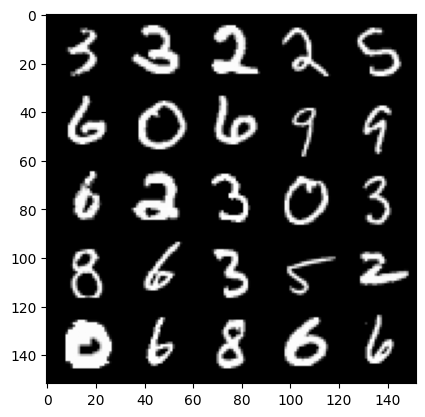

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 4.135784485340117, discriminator loss: 0.04812718173488974


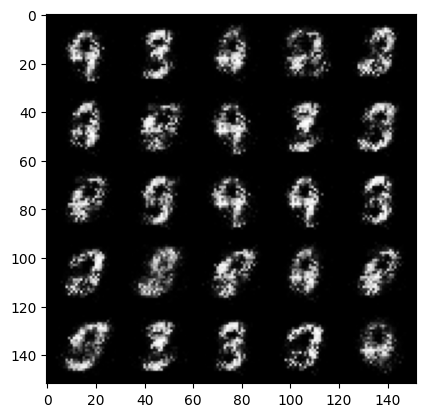

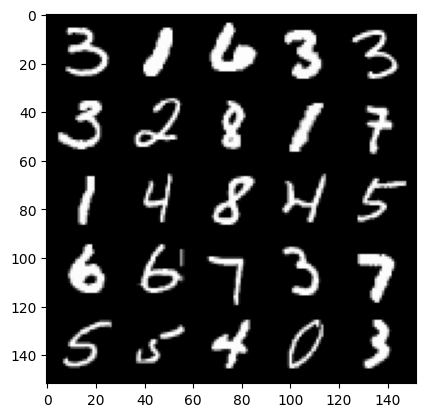

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 4.0482220230102515, discriminator loss: 0.05726205343753102


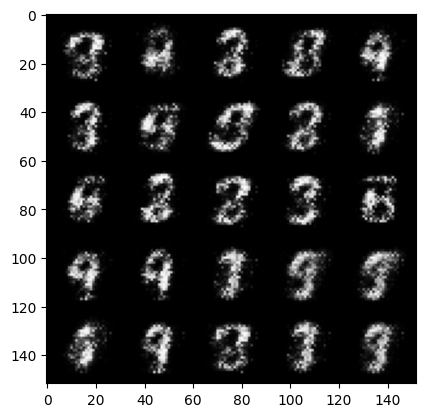

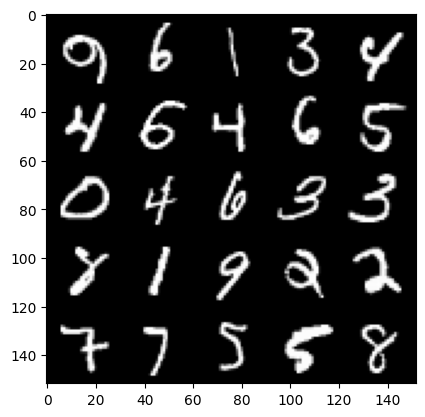

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 4.068165097236636, discriminator loss: 0.06050438410788772


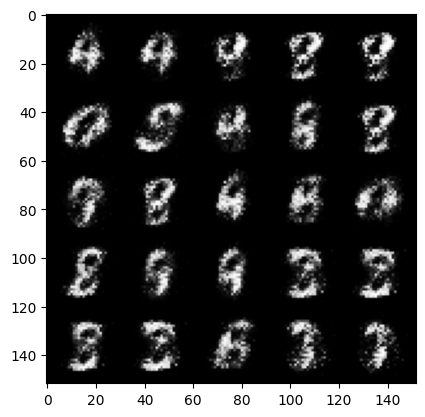

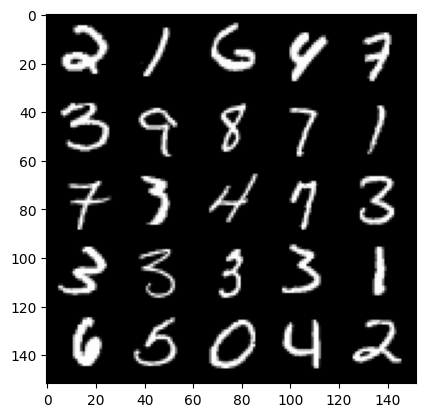

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 4.061153798103331, discriminator loss: 0.062390677452087415


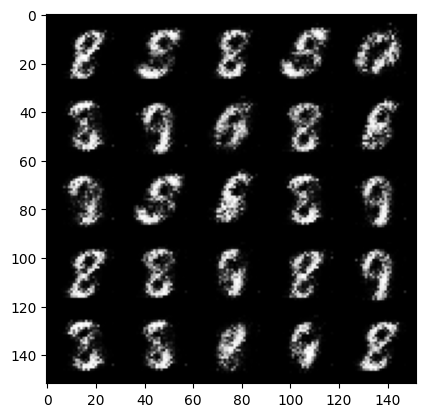

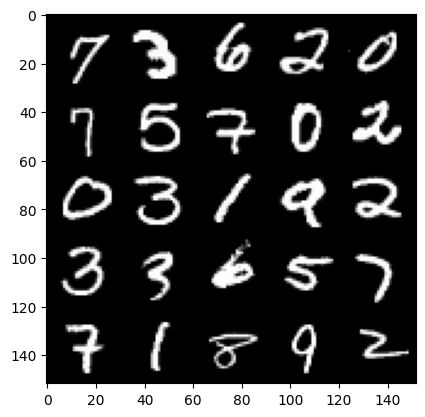

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 4.026236713886259, discriminator loss: 0.06170734236389401


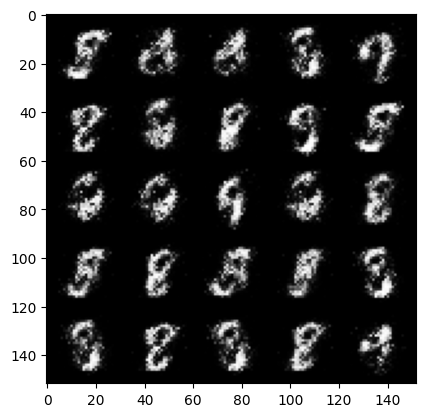

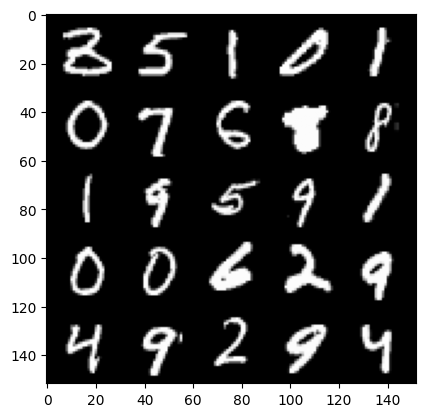

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 4.161149906635286, discriminator loss: 0.060213987398892645


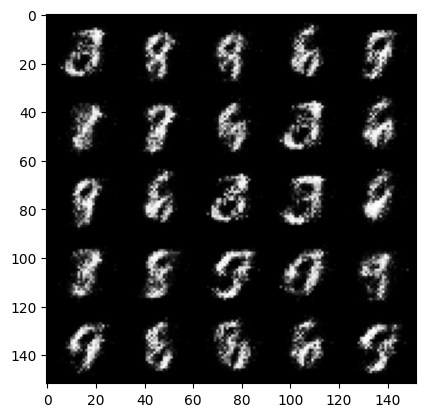

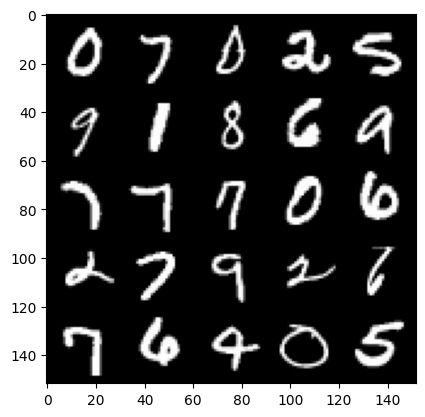

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 3.9890744786262533, discriminator loss: 0.07328521937131882


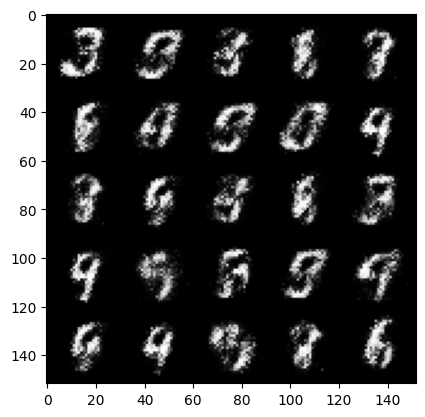

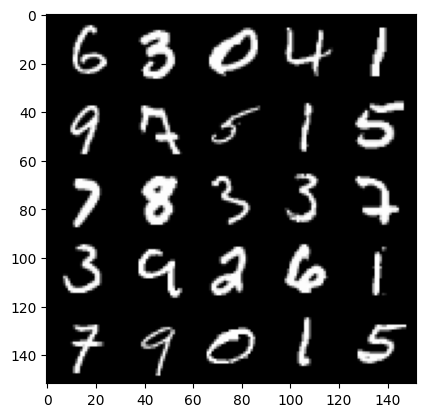

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 4.162845997810366, discriminator loss: 0.06763214527443055


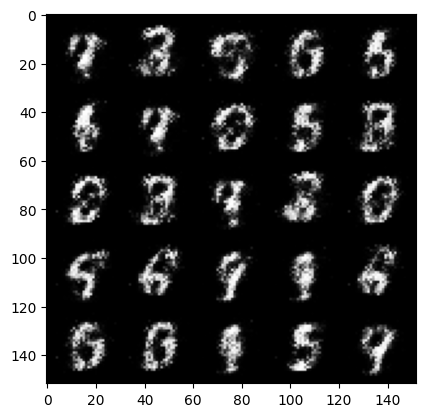

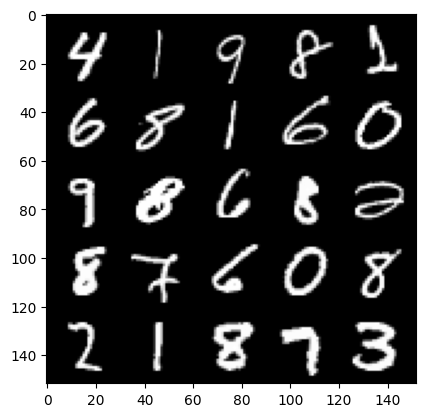

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 4.052449818134306, discriminator loss: 0.07146432578936218


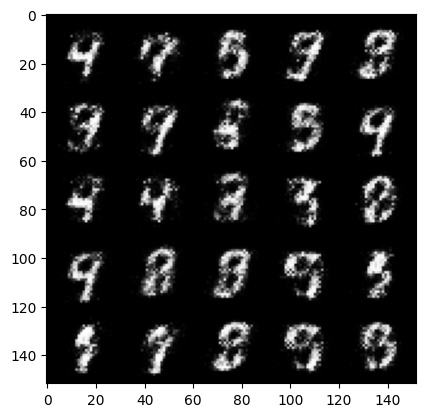

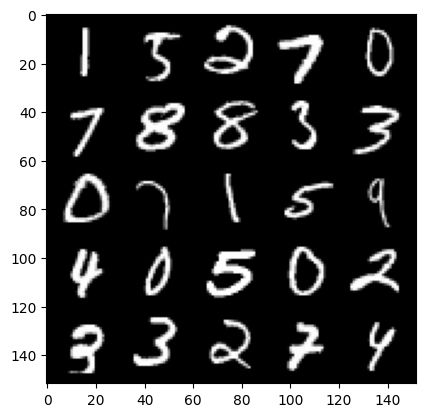

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 3.8755727782249463, discriminator loss: 0.09150332899391656


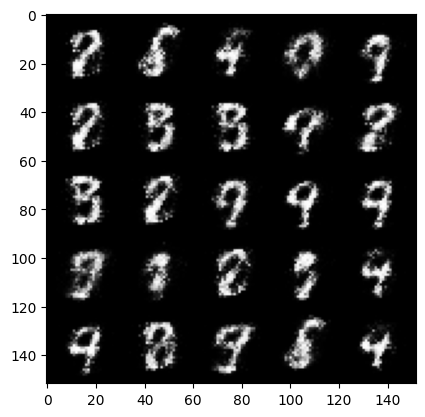

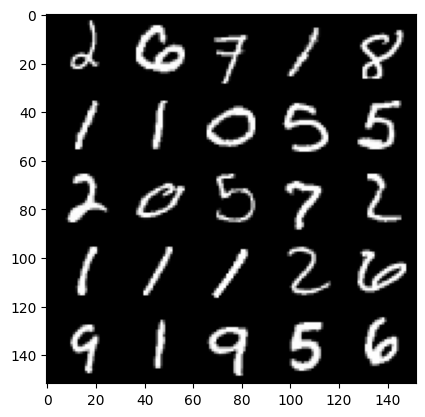

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 3.8599575634002656, discriminator loss: 0.09760452608764168


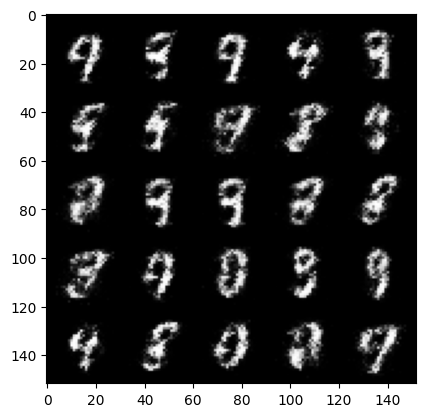

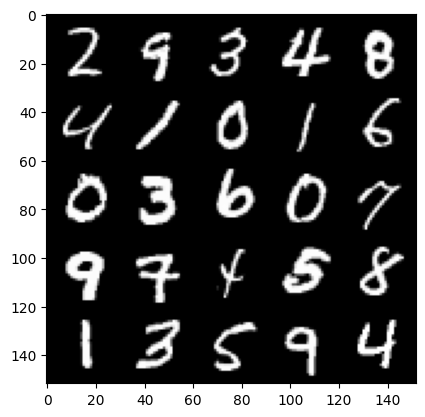

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 3.6171180629730197, discriminator loss: 0.10631524224579326


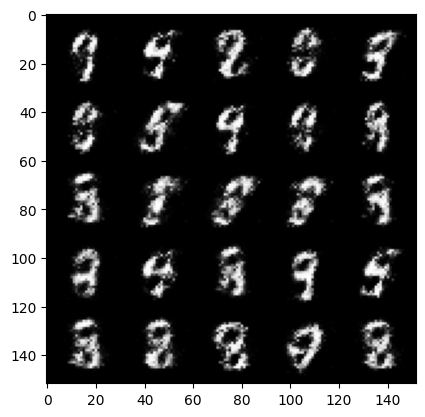

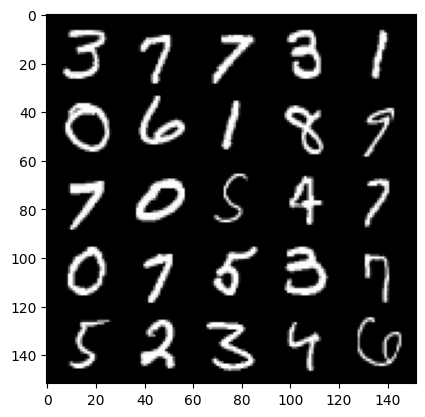

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 3.624177010536193, discriminator loss: 0.11453667525202045


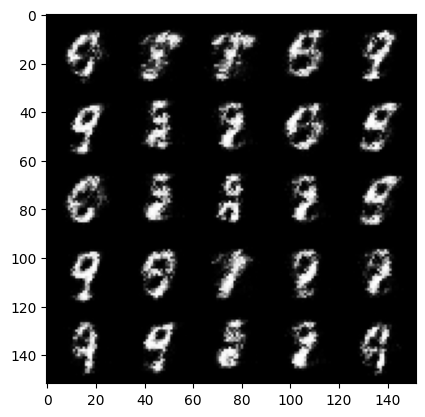

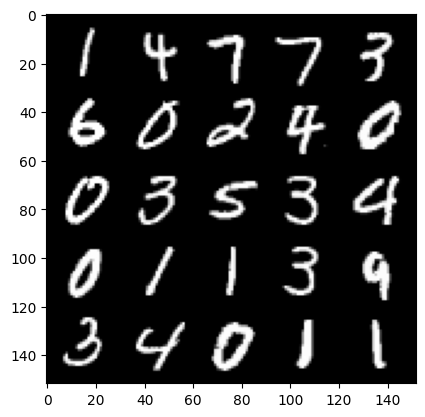

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 3.6083627896308945, discriminator loss: 0.11259717117995031


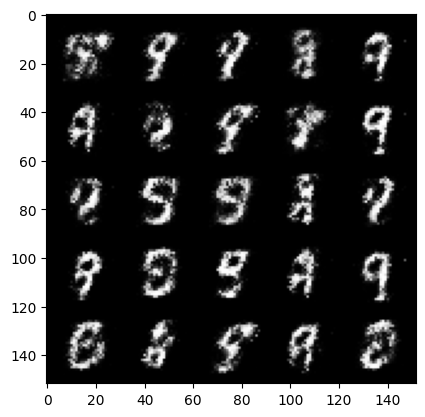

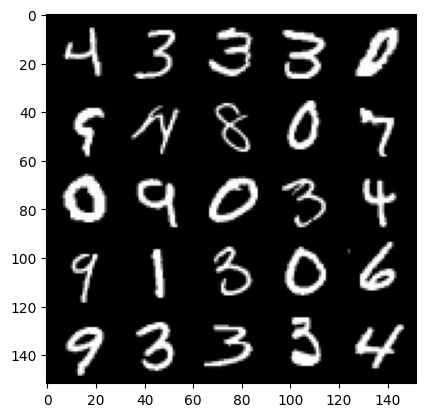

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 3.402174905776976, discriminator loss: 0.1182261617928743


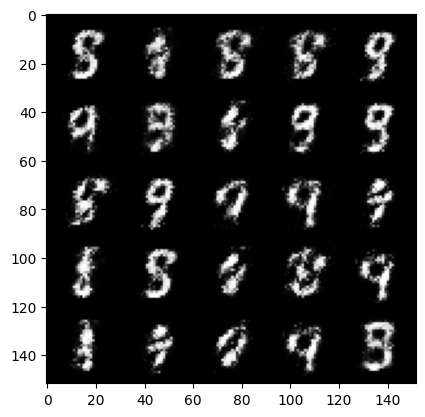

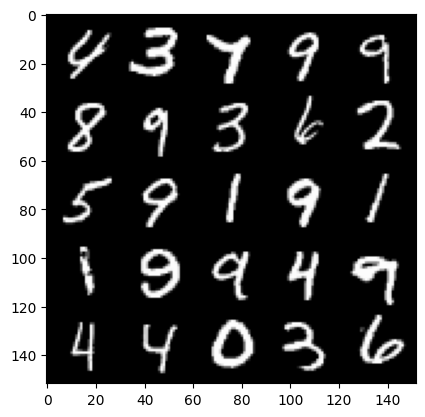

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 3.4699654288291915, discriminator loss: 0.11110759011656045


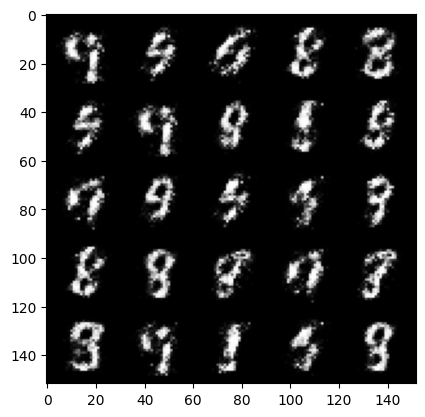

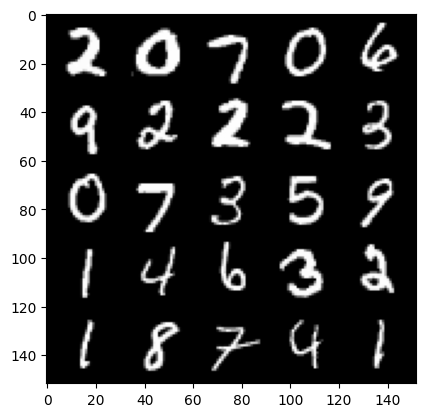

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 3.5204915208816527, discriminator loss: 0.11716508404910574


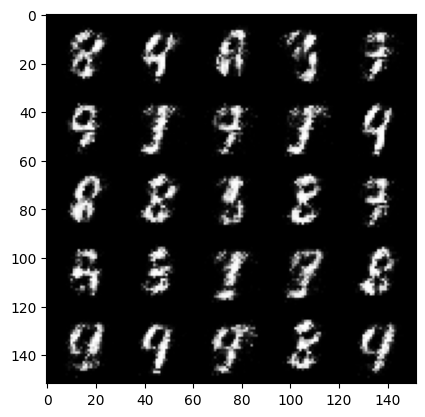

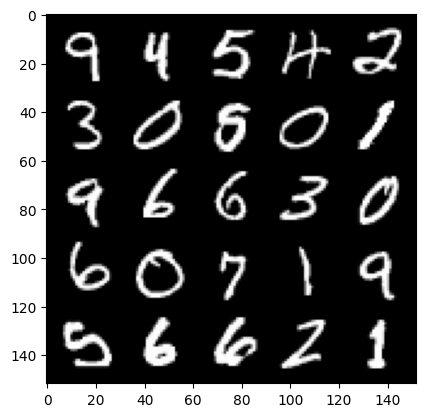

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 3.725667053222655, discriminator loss: 0.11751022510975602


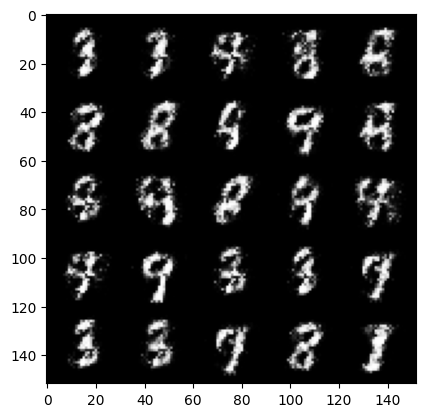

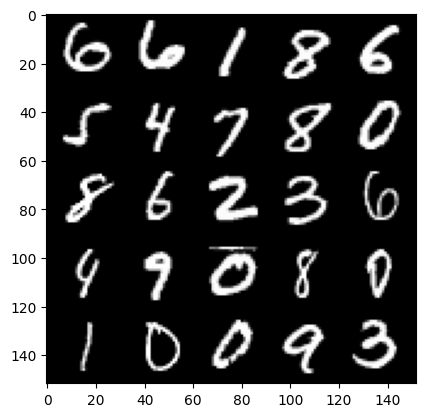

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 3.4372121052741984, discriminator loss: 0.13027980098873385


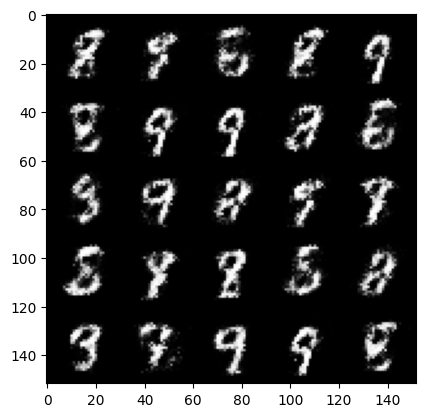

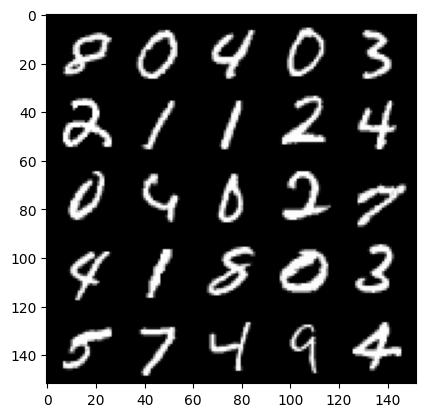

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 3.443322040081023, discriminator loss: 0.12048123183846465


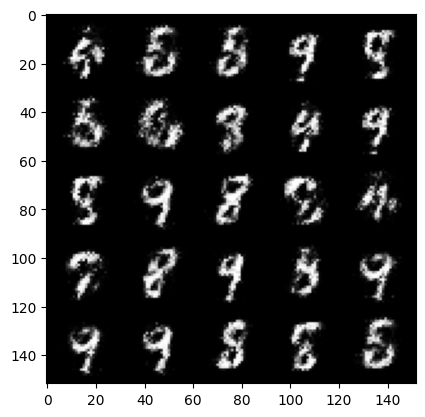

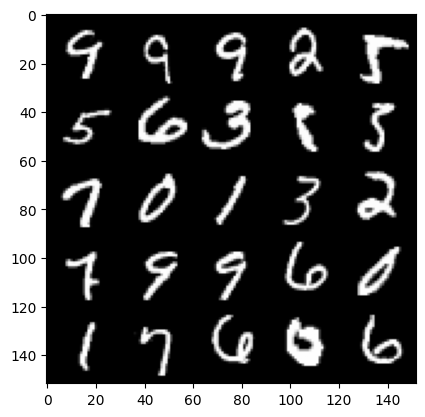

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 3.339308771133421, discriminator loss: 0.1482326781153678


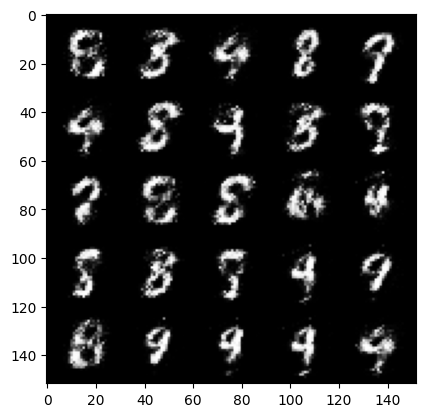

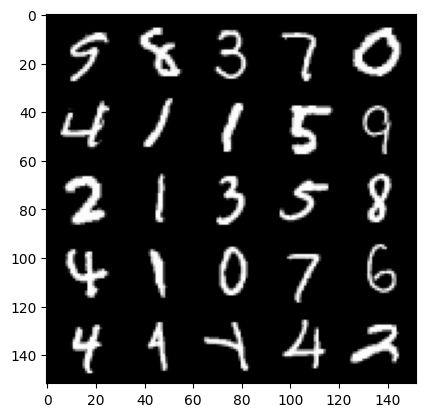

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 3.1704044451713593, discriminator loss: 0.16122951550781725


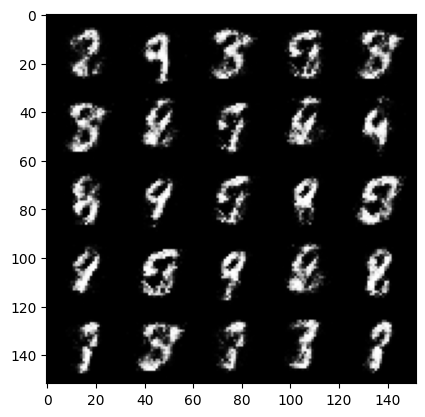

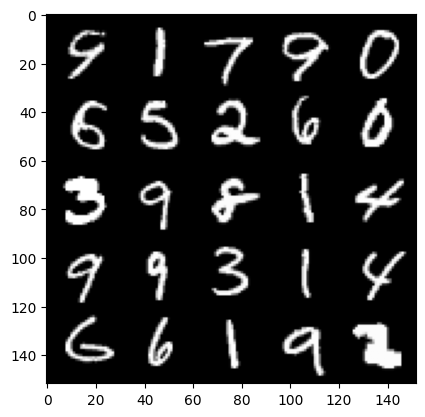

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 3.179639538288118, discriminator loss: 0.14388492816686624


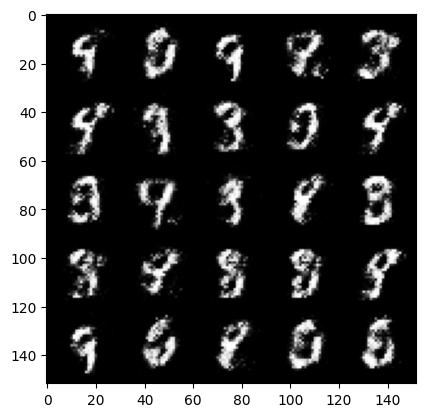

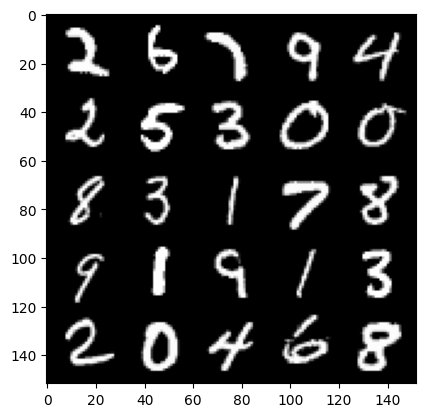

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 3.230931180953978, discriminator loss: 0.14486069425940518


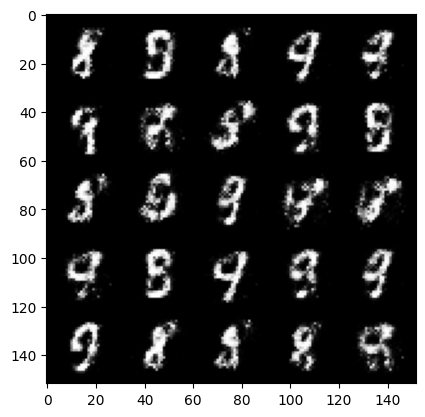

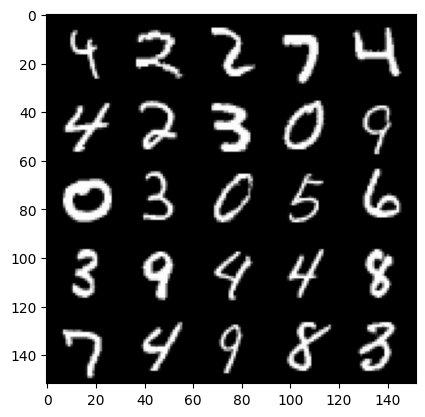

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 3.2911039862632756, discriminator loss: 0.13539212161302555


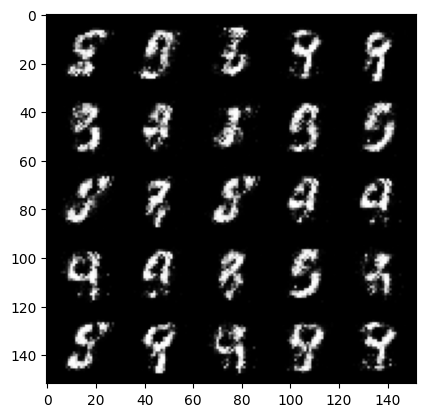

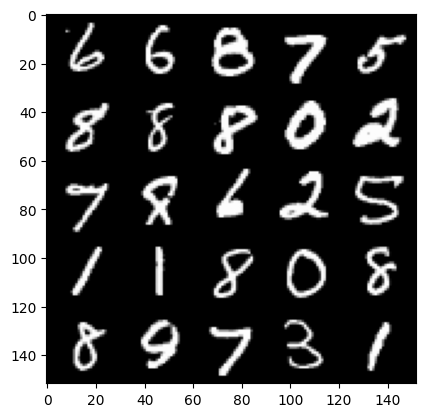

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 3.313009503364559, discriminator loss: 0.13886424790322774


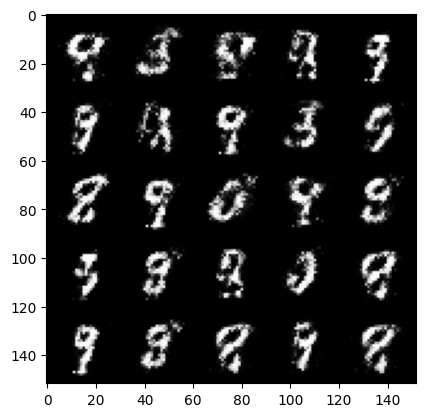

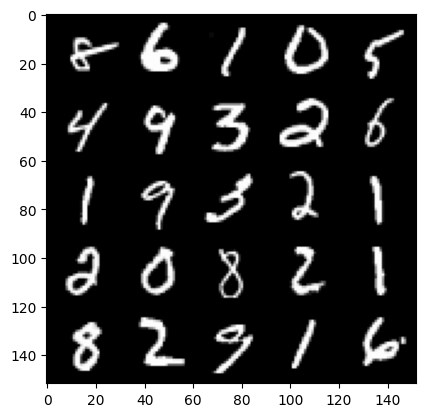

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 3.44092303943634, discriminator loss: 0.14197558687627307


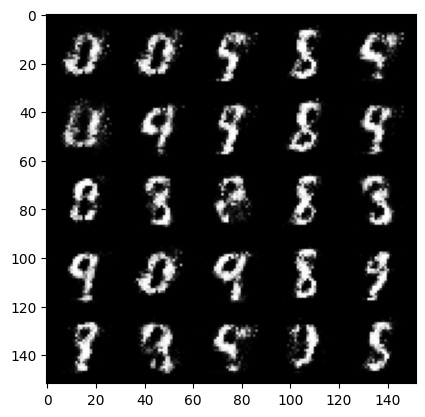

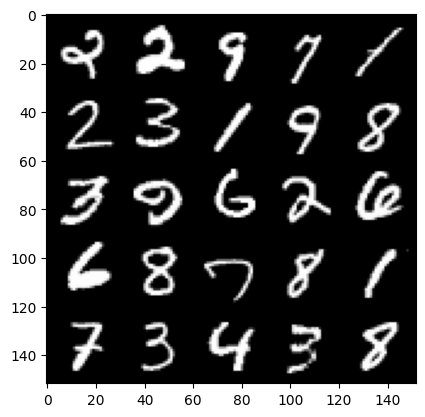

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 3.232862560749054, discriminator loss: 0.14403783190250388


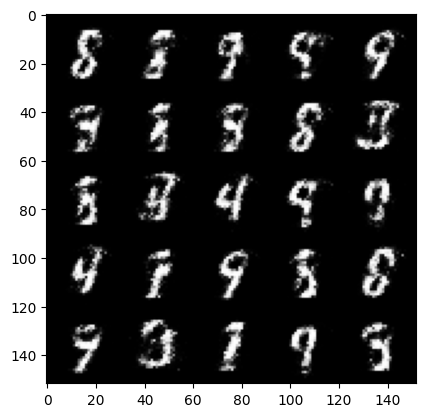

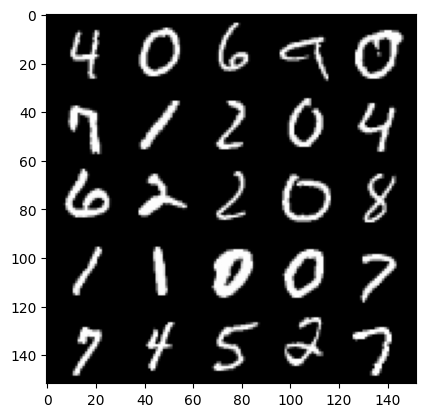

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 3.0945553936958308, discriminator loss: 0.1781772182285785


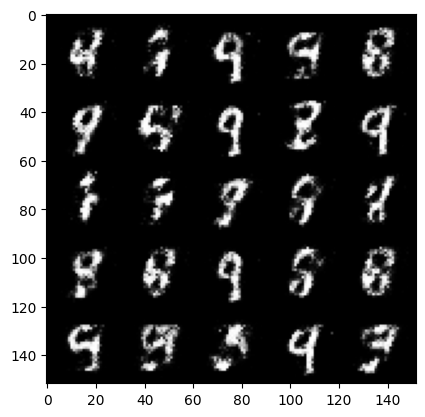

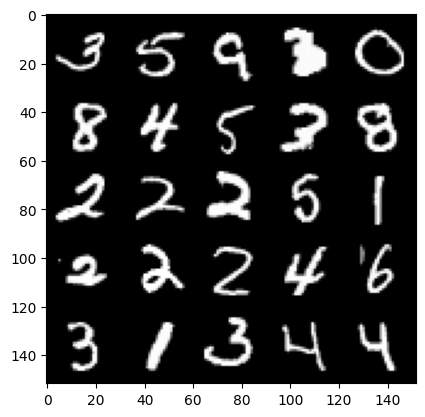

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 3.0592958178520204, discriminator loss: 0.17811348760128023


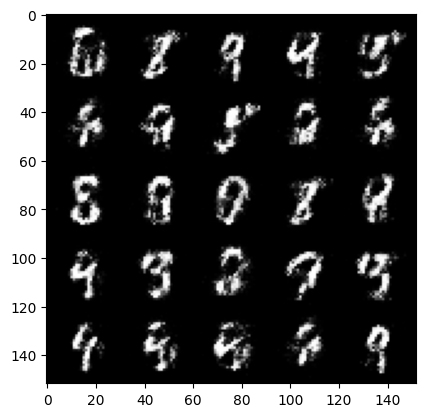

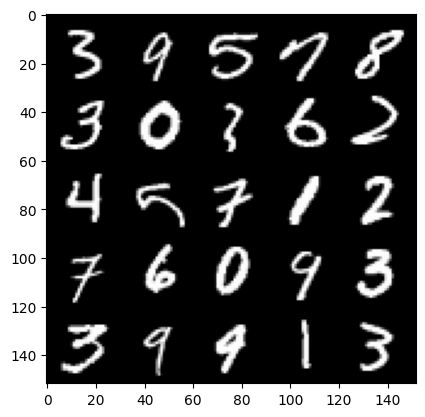

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator loss: 3.013292742729189, discriminator loss: 0.17788600154221068


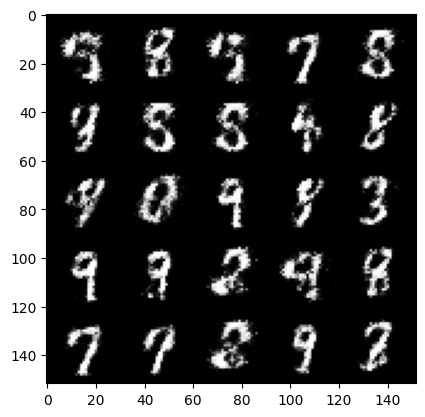

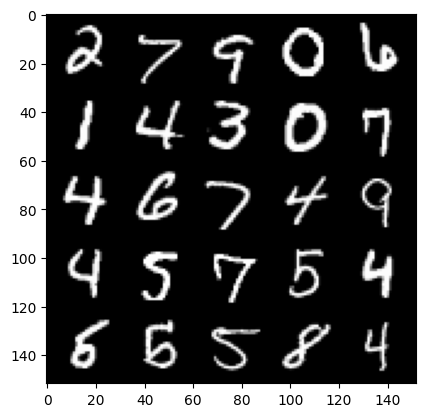

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 3.0003419690132147, discriminator loss: 0.16897872668504713


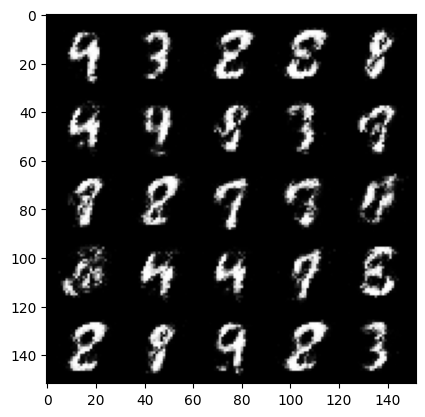

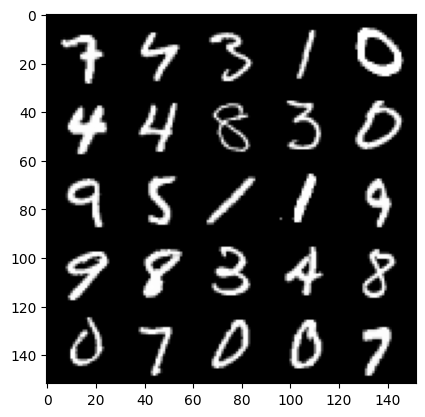

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23500: Generator loss: 3.1820615916252164, discriminator loss: 0.17368999575078478


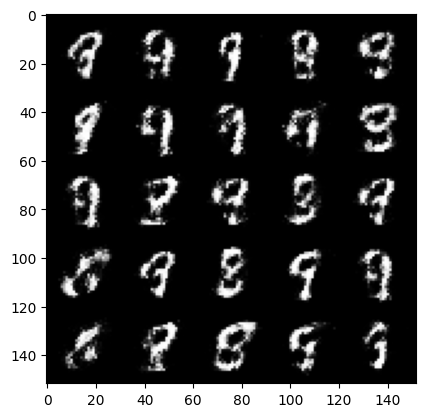

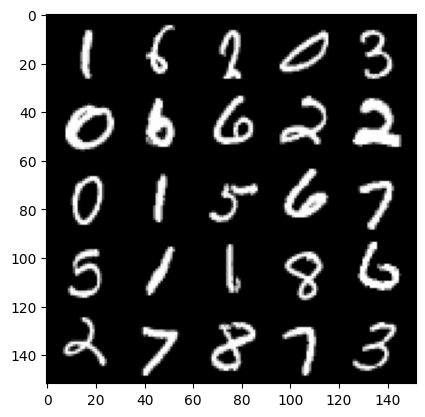

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24000: Generator loss: 3.1390762529373175, discriminator loss: 0.1799403557181358


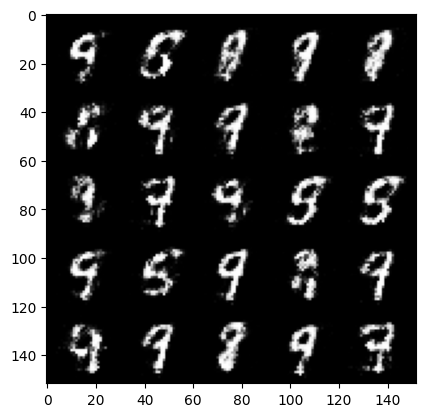

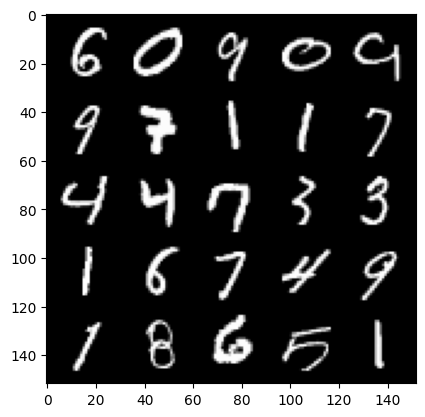

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24500: Generator loss: 3.100295642852785, discriminator loss: 0.1767436223924159


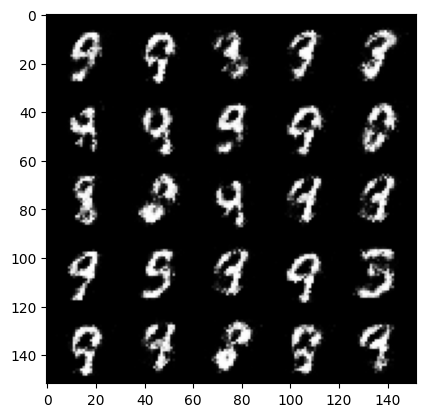

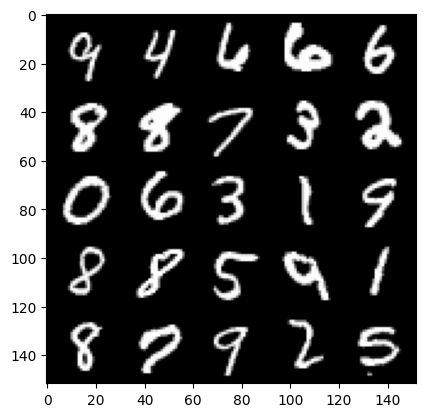

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25000: Generator loss: 3.070013922691349, discriminator loss: 0.17068254233896726


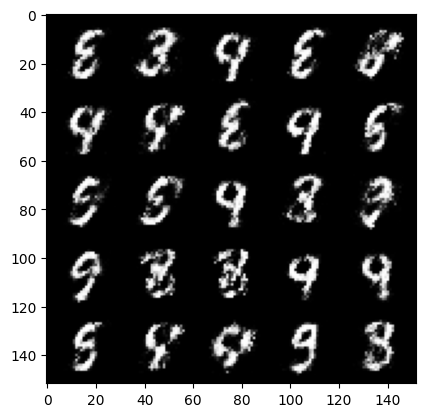

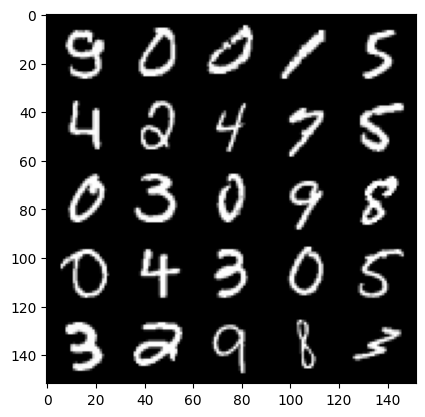

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25500: Generator loss: 2.968356298446655, discriminator loss: 0.1867269751131537


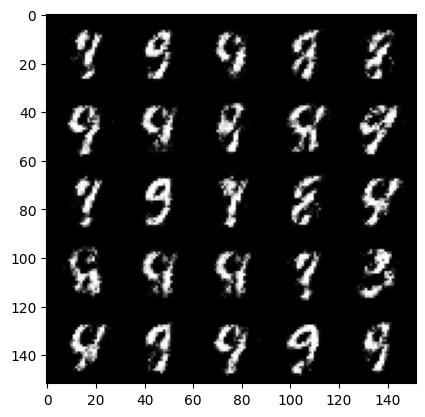

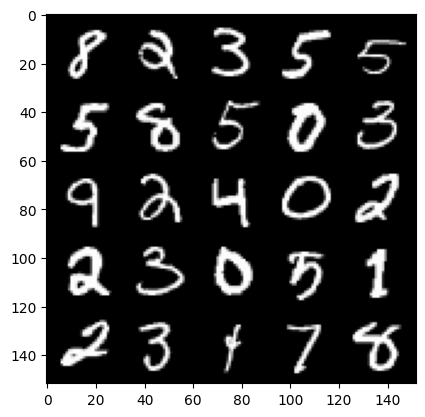

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26000: Generator loss: 3.04271323633194, discriminator loss: 0.17073009945452203


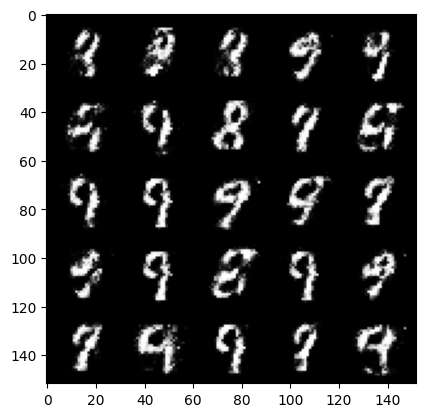

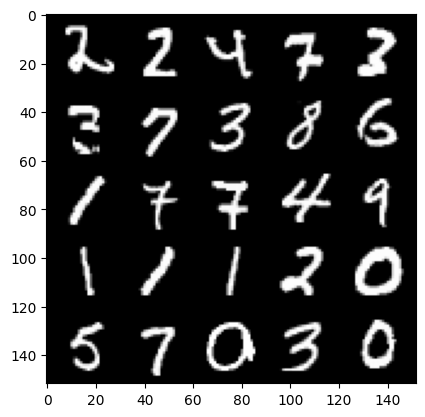

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26500: Generator loss: 2.9650142393112175, discriminator loss: 0.1979889104068279


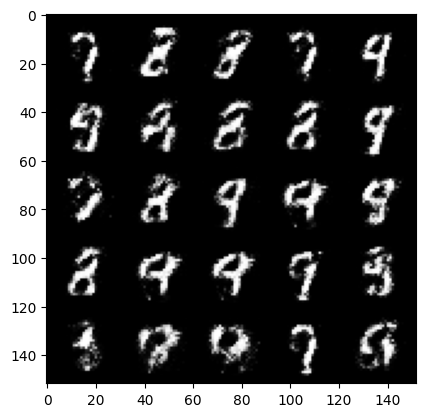

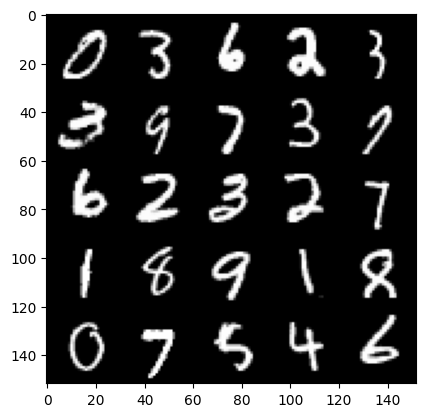

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27000: Generator loss: 2.9325937304496765, discriminator loss: 0.19668673548102383


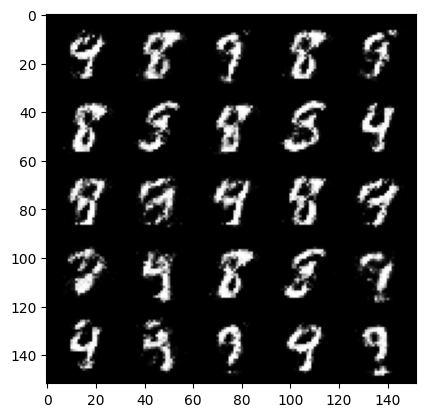

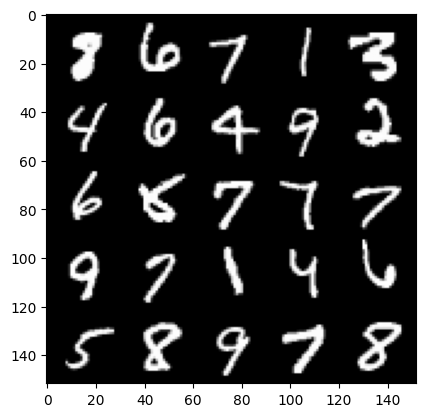

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27500: Generator loss: 2.781623261928557, discriminator loss: 0.21654077392816537


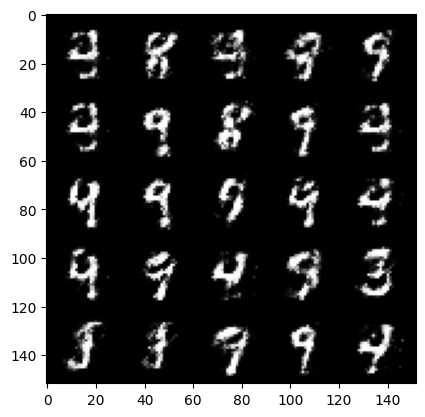

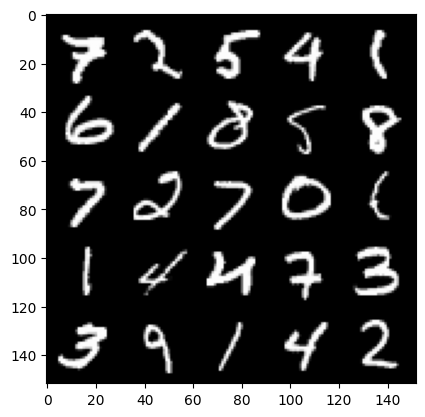

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28000: Generator loss: 2.7778168358802797, discriminator loss: 0.21194672447443005


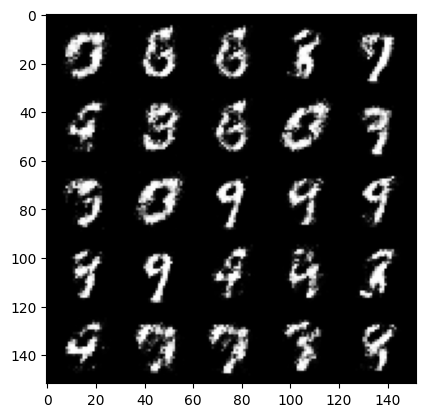

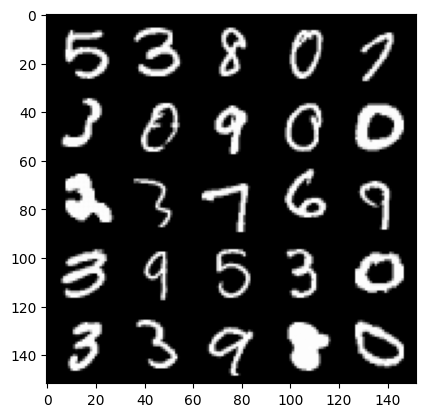

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28500: Generator loss: 2.646203475713732, discriminator loss: 0.2269771865010262


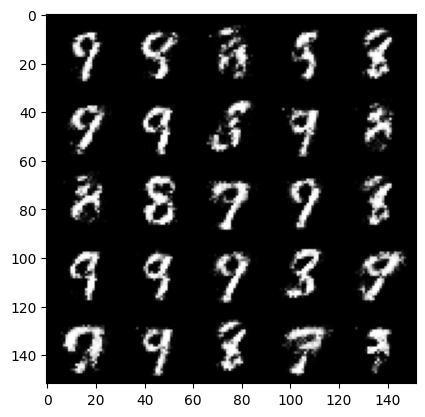

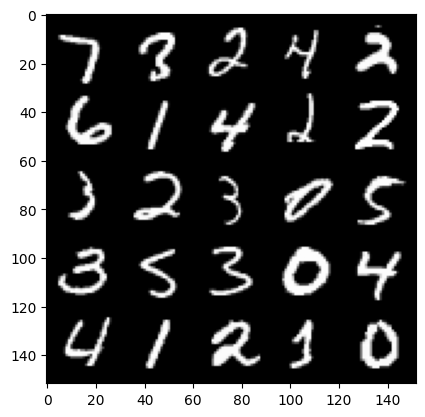

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29000: Generator loss: 2.7194274344444263, discriminator loss: 0.19786930944025505


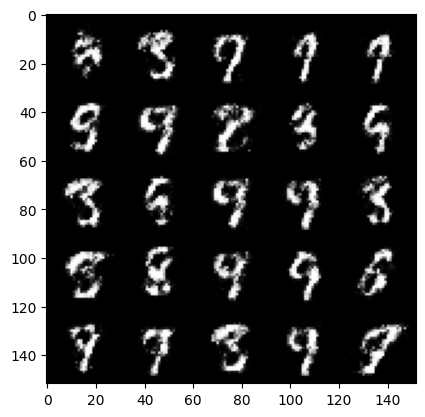

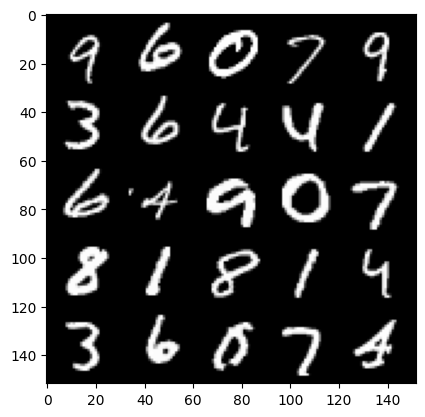

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29500: Generator loss: 2.5738198044300082, discriminator loss: 0.23981413504481305


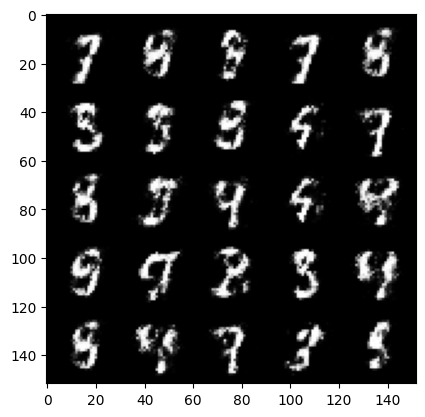

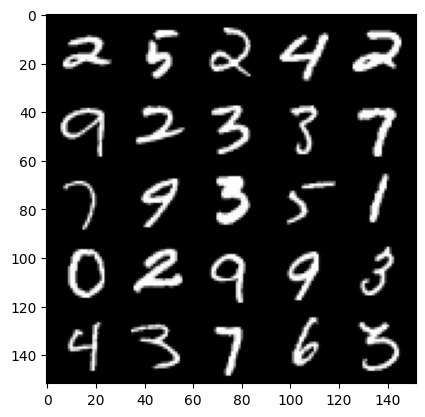

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30000: Generator loss: 2.4750086097717303, discriminator loss: 0.2481262182593346


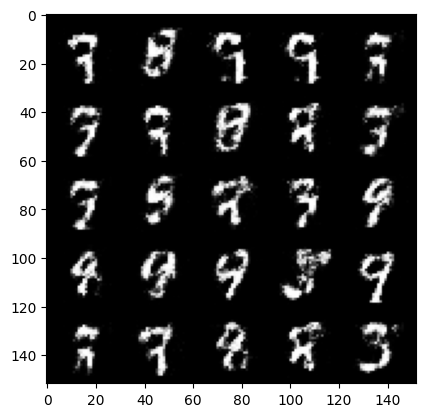

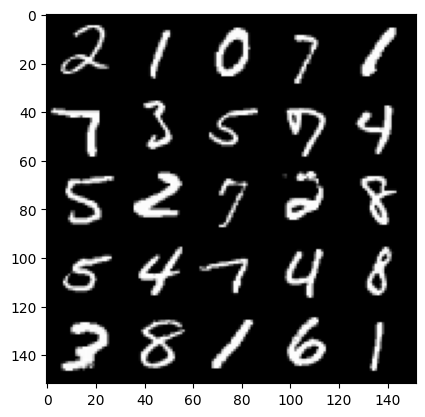

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30500: Generator loss: 2.721049189090731, discriminator loss: 0.2066305079162124


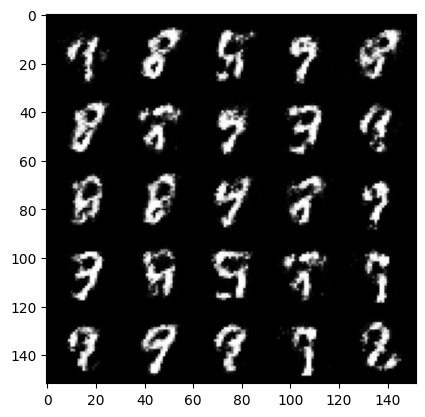

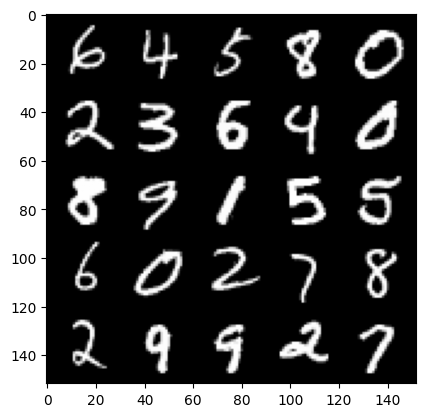

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31000: Generator loss: 2.602765347003935, discriminator loss: 0.23517442569136607


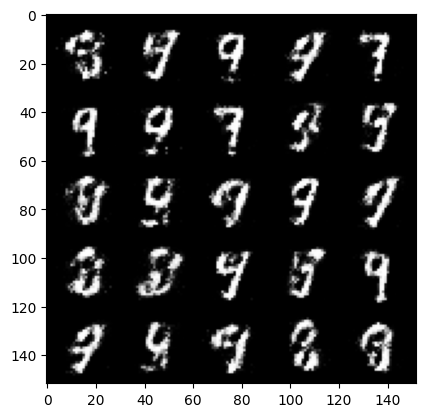

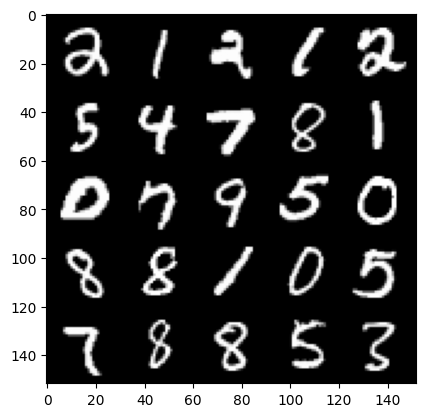

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31500: Generator loss: 2.5263755917549156, discriminator loss: 0.2563289306163789


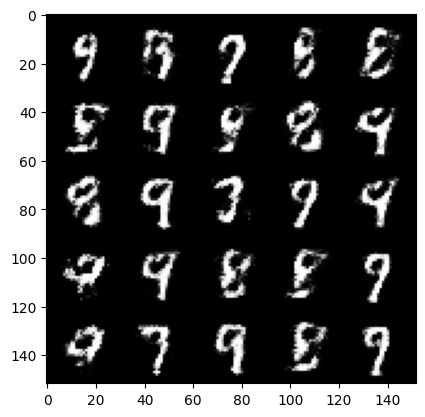

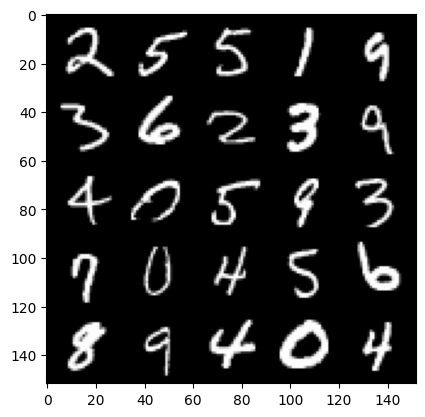

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000: Generator loss: 2.4189470028877267, discriminator loss: 0.24676936194300678


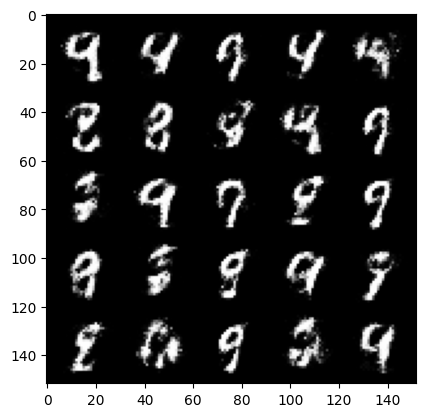

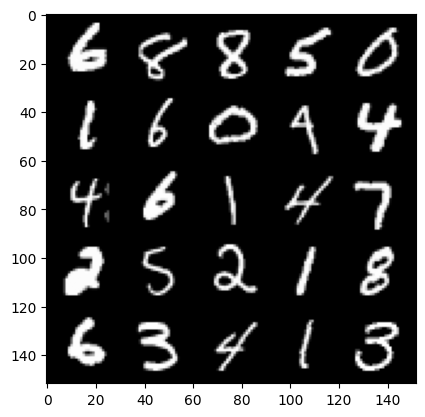

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32500: Generator loss: 2.6653019146919252, discriminator loss: 0.2299341221451757


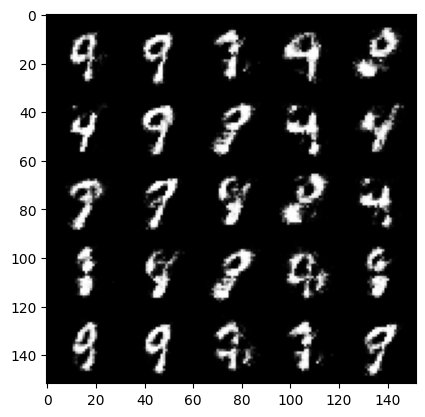

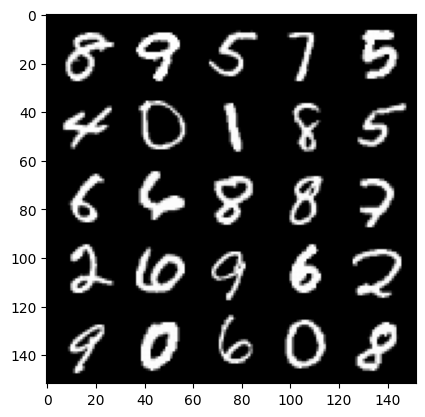

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000: Generator loss: 2.504566755533217, discriminator loss: 0.24876604393124577


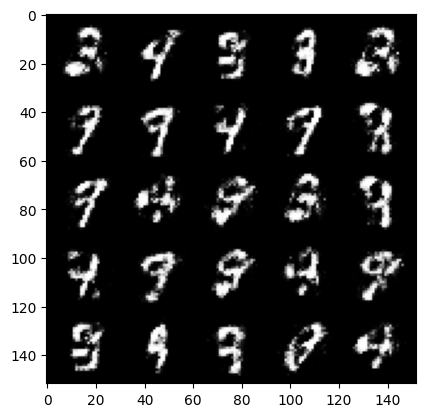

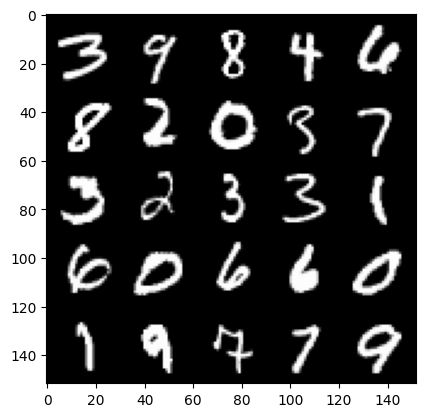

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33500: Generator loss: 2.466062285184861, discriminator loss: 0.2591973512172698


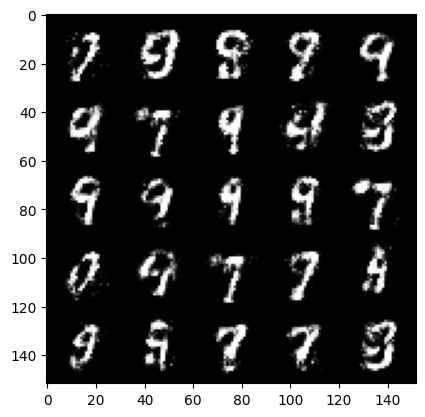

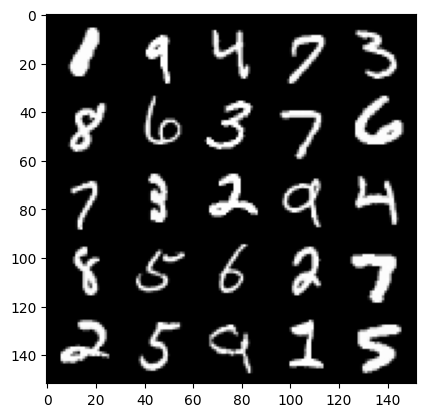

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34000: Generator loss: 2.3675854184627525, discriminator loss: 0.25611635354161294


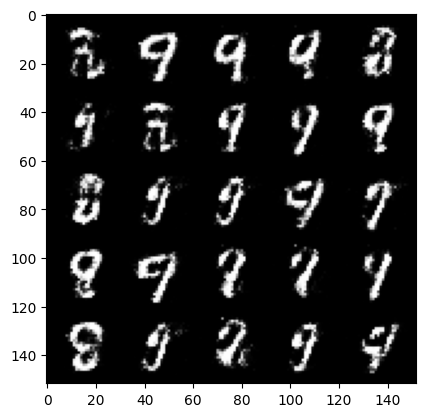

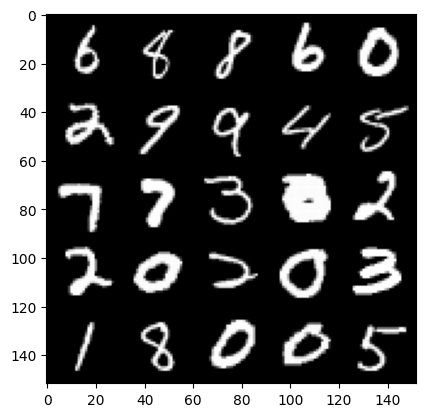

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34500: Generator loss: 2.4984603736400595, discriminator loss: 0.24011798012256635


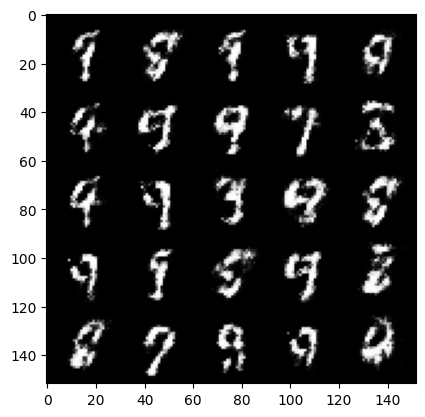

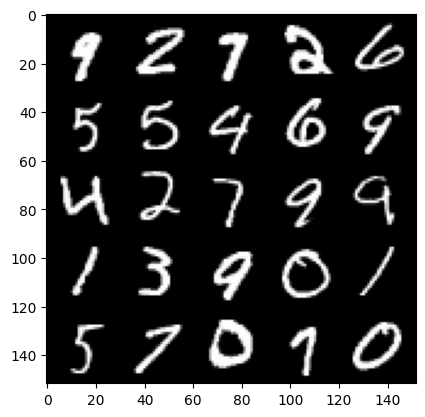

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35000: Generator loss: 2.46575558757782, discriminator loss: 0.26423081278800975


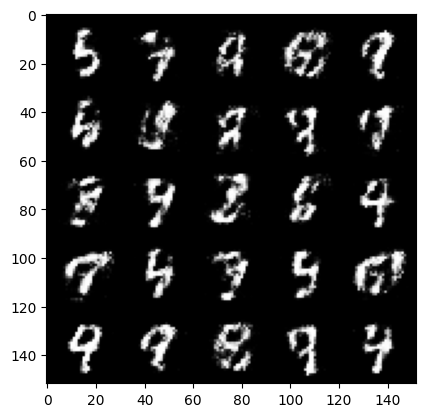

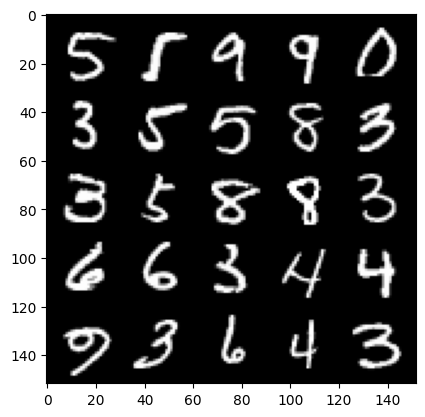

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35500: Generator loss: 2.430812463521957, discriminator loss: 0.2580323663949969


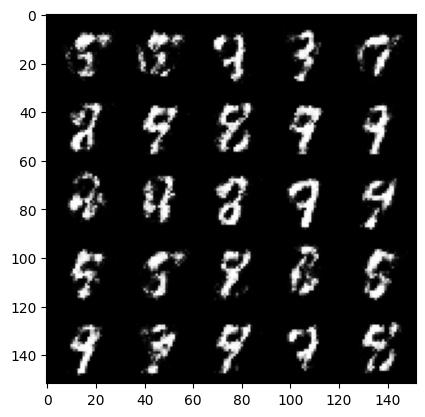

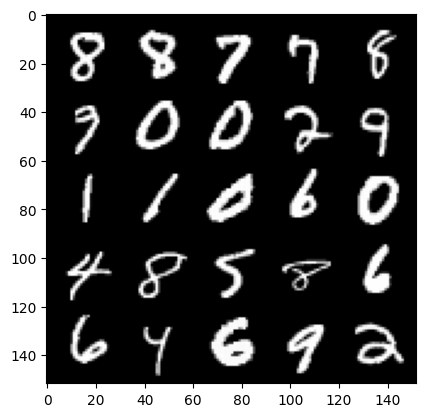

  0%|          | 0/469 [00:00<?, ?it/s]

In [ ]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True
gen_loss = False
error = False
for epoch in range(n_epochs):
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)
        disc_opt.zero_grad()
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        disc_loss.backward(retain_graph=True)
        disc_opt.step()
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Failure runtime stuff")

        mean_discriminator_loss += disc_loss.item() / display_step
        mean_generator_loss += gen_loss.item() / display_step
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1

## Last product

In [ ]:
fake_noise = get_noise(cur_batch_size, z_dim, device=device)
fake = gen(fake_noise)
show_tensor_images(fake)

# Saving model

In [ ]:
torch.save(disc.state_dict(), 'disc.pth')
torch.save(gen.state_dict(), 'gen.pth')

In [ ]:
!ls -l

total 8132
-rw-r--r-- 1 root root 2267599 Nov  9 17:45 disc.pth
-rw-r--r-- 1 root root 6046987 Nov  9 17:45 gen.pth
drwxr-xr-x 3 root root    4096 Nov  9 15:26 MNIST
drwxr-xr-x 1 root root    4096 Nov  7 14:37 sample_data
